In [1]:
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from shapely.geometry import box, LineString, Point
import xarray as xr
import os
import cmocean as cm
import numpy as np


# -*- coding: utf-8 -*-
# Add the path to the swot library
import sys
sys.path.append('../SWOT-OpenToolkit/src/')
import swot_ssh_utils as swot


# Add the path to the Tatsu's swot library
import sys
sys.path.append('./tatsu_src/')
import tatsu_swot_utils as tatsu_swot
import tatsu_plotting_scripts as tatsu_swot_plot
import tatsu_data_loaders as tatsu_loader
import tatsu_download_swaths as tatsu_download

#turn off warnings
import warnings
warnings.filterwarnings("ignore")




In [2]:
from importlib import reload
tatsu_swot_plot = reload(tatsu_swot_plot)

In [3]:
from glob import glob

import matplotlib
import matplotlib.pyplot as plt
import numpy as np

import cartopy.crs as ccrs
import cartopy.feature as cfeature
import cartopy.io.shapereader as shpreader


def load_bathymetry(zip_file_url):
    """Read zip file from Natural Earth containing bathymetry shapefiles"""
    # Download and extract shapefiles
    import io
    import zipfile

    # Download bathymetry if you don't have it already..
    if not os.path.exists("ne_10m_bathymetry_all/"):
        import requests
        r = requests.get(zip_file_url)
        z = zipfile.ZipFile(io.BytesIO(r.content))
        z.extractall("ne_10m_bathymetry_all/")

    # Read shapefiles, sorted by depth
    shp_dict = {}
    files = glob('ne_10m_bathymetry_all/*.shp')
    assert len(files) > 0
    files.sort()
    depths = []
    for f in files:
        depth = '-' + f.split('_')[-1].split('.')[0]  # depth from file name
        depths.append(depth)
        bbox = (-180, -90, 180, 90)  # (x0, y0, x1, y1)
        nei = shpreader.Reader(f, bbox=bbox)
        shp_dict[depth] = nei
    depths = np.array(depths)[::-1]  # sort from surface to bottom
    return depths, shp_dict


if __name__ == "__main__":
    # Load data (14.8 MB file)
    depths_str, shp_dict = load_bathymetry(
        'https://naturalearth.s3.amazonaws.com/' +
        '10m_physical/ne_10m_bathymetry_all.zip')

    # Construct a discrete colormap with colors corresponding to each depth
    depths = depths_str.astype(int)
    N = len(depths)
    nudge = 0.01  # shift bin edge slightly to include data
    boundaries = [min(depths)] + sorted(depths+nudge)  # low to high
    norm = matplotlib.colors.BoundaryNorm(boundaries, N)
    blues_cm = matplotlib.colormaps['Blues_r'].resampled(N)
    colors_depths = blues_cm(norm(depths))


In [4]:
def plot_cycle(swaths,field="ssha",title="Example Swaths August 2024 (Cycle 4)",cbar_title="SSHA (m)",
              subplot_kw = {'projection': ccrs.PlateCarree()},
              ssha_plot_kw = {"cmap":cm.cm.balance,"transform":ccrs.PlateCarree(),
                    "s":1,"vmin":-0.3,"vmax":0.3,"marker":".","alpha":1,"linewidths":0}
              ):

    # Add labels to keep track of specific swaths
    swath_labels = []
    for swath in swaths:
        label_lat = np.around(swath.latitude[-1,:].min().values,2)
        label_lon = np.around(swath.longitude[-1,:].min().values,2)
        label_cycle = swath.cycle
        label_pass = swath.pass_ID
        if "time" in swath:
            label_time = swath.time.mean().values.astype(str)[:19]
        else:
            label_time = "" 
        swath_labels.append({"label_lat":label_lat,
                             "label_lon":label_lon,
                             "label_cycle":label_cycle,
                             "label_pass":label_pass,
                             "label_time":label_time
                            })

    # Initialize plot
    fig, axs = plt.subplots(1,1,figsize=(20,20),subplot_kw=subplot_kw,dpi=300)

    # Add some geographic features
    axs.add_feature(cfeature.COASTLINE.with_scale('10m'))
    axs.add_feature(cfeature.LAND, edgecolor='none', facecolor='lightgray')
    
    # Add bathymetry
    # Iterate and plot feature for each depth level
    for i, depth_str in enumerate(depths_str):
        axs.add_geometries(shp_dict[depth_str].geometries(),
                          crs=ccrs.PlateCarree(),
                          color=colors_depths[i])
    
    # Plot initial swath for colorbar
    cax = axs.scatter(swaths[0].longitude[:,:], swaths[0].latitude[:,:],
                        c=swaths[0][field][:,:], **ssha_plot_kw, zorder=10)
    
    # add colorbar and gridlines
    cbar = plt.colorbar(cax, ax=axs, shrink=0.4)
    gl = axs.gridlines(crs=ccrs.PlateCarree(), draw_labels=True,
                    linewidth=1, color='gray', alpha=0.5, linestyle='--')
    
    # Overlay remaining swaths
    for i, plt_swath in enumerate(swaths[1::]):
        print(i,end=",")
        axs.scatter(plt_swath.longitude[:,:], plt_swath.latitude[:,:],
                    c=plt_swath[field][:,:], **ssha_plot_kw, zorder=10+i)

    # If you're plotting quality flags, add a key
    if field == "quality_flag":
        ticks=np.arange(0,10,1)
        cbar.ax.set_yticks(ticks)
        cbar.ax.set_yticklabels(swaths[0].quality_flag.flag_meanings.split(" "))

    # Add labels
    for swath_label in swath_labels:
        txt = axs.text(swath_label["label_lon"],swath_label["label_lat"],
                      (f"Cycle {swath_label["label_cycle"]} \n"
                      + f"Pass #{swath_label["label_pass"]} \n"
                      + f"{swath_label["label_time"][:10]} \n"
                      + f"{swath_label["label_time"][10:19]} " ),
                     fontsize=10,weight='bold',zorder=len(swaths)+30)
        txt.set_bbox(dict(facecolor='white', alpha=1, edgecolor='k'))
    
    axs.set_ylabel("Latitude (deg)",fontsize=30)
    axs.set_xlabel("Longitude (deg)",fontsize=30)
    axs.set_title(f"Cycle {swath_label["label_cycle"]} Pass #{swath_label["label_pass"]} \n"
                      + f"{swath_label["label_time"][:10]} {swath_label["label_time"][10:19]} ",
                    fontsize=30,pad=40)
    cbar.set_label(cbar_title,rotation=270,fontsize=30,labelpad=40)
    
    fig.tight_layout()

    plt.show()
    plt.close()
    
    return plt


# A notebook to try some methods for calculating the spectrum

# Load the swath/pass combos you want

In [5]:
# Specify the path to the subsetted data
L3_agulhas_path = f"../../SWOT_L3/Unsmoothed"

# Define domain
# Rough California
sw_corner = [-150.0, 30.0]
ne_corner = [-115.0, 39.0]
lat_lims = [sw_corner[1],ne_corner[1]]

# Define mission phase (1-day repeat vs science) and 
# cycles we are interested in
# Use sph_calval_swath for the 1-day repeats
path_to_sph_file="../orbit_data/sph_calval_swath.zip"
# Cycles 474 - 578 are from the 1-day repeat 
cycles = [str(c_num).zfill(3) for c_num in range(474,500)]



pass_IDs_list = tatsu_download.find_swaths(sw_corner, ne_corner,
                                           path_to_sph_file=path_to_sph_file)
# Fast repeat California
pass_IDs_list = ["013","026"]

cycle_data = {}

# MAKE SURE TO CHANGE THE SAVE PATH
for cycle in cycles:
    cycle_data[cycle] = tatsu_loader.load_cycle(L3_agulhas_path,fields=["time","ssha","ssha_unedited","ssha_noiseless","sigma0"],
                                                cycle=cycle,pass_ids=pass_IDs_list,subset=True,lats=lat_lims
                                               )


Loading SWOT_L3_LR_SSH_Unsmoothed_474_013_20230329T081622_20230329T090619_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_474_026_20230329T191927_20230329T201032_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_475_026_20230330T191004_20230330T200109_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_476_013_20230331T083831_20230331T084734_v1.0.2.nc
Whoops can't open dataset
An error occured: 'list' object has no attribute 'assign_attrs'
Loading SWOT_L3_LR_SSH_Unsmoothed_477_026_20230401T185119_20230401T194225_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_478_013_20230402T073744_20230402T082850_v1.0.2.nc
Whoops can't open dataset
An error occured: [Errno -101] NetCDF: HDF error: '/scratch/projects/shaferlab/tatsu/SWOT_L3/Unsmoothed/cycle_478/SWOT_L3_LR_SSH_Unsmoothed_478_013_20230402T073744_20230402T082850_v1.0.2.nc'
Loading SWOT_L3_LR_SSH_Unsmoothed_478_026_20230402T184157_20230402T193303_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_479_013_20230403T072822_20230403T081927_v1.0.2.nc
Loading SWOT_L3_LR_SS

## Print the start and end times of the swaths to plot
Note this is the mean time over the section you are plotting

In [6]:
swaths_to_plot_subset = cycle_data["490"]

In [7]:
print(swaths_to_plot_subset[0].time.mean().values)
print(swaths_to_plot_subset[-1].time.mean().values)


2023-04-14T06:20:55.822422313
2023-04-14T17:05:04.021907230


# Plot the rough extent of the passes you downloaded

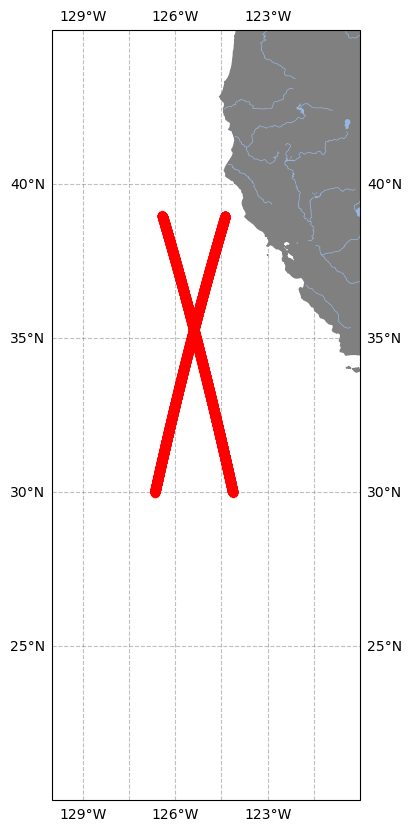

In [8]:
line_min = None
line_max = None

# Create a map using cartopy

fig, ax = plt.subplots(figsize=(5, 10), subplot_kw=dict(projection=ccrs.PlateCarree()))

# add land, rivers, lakes, and coastlines
land = cfeature.NaturalEarthFeature('physical', 'land', '10m', edgecolor='face', facecolor='gray')
ax.add_feature(land)
ax.add_feature(cfeature.RIVERS, linewidth=0.5)
ax.add_feature(cfeature.LAKES, linewidth=0.5)


# add states and provinces
states_provinces = cfeature.NaturalEarthFeature(
    category='cultural',
    name='admin_1_states_provinces_lines',
    scale='10m',
    facecolor='none')

for i, swath in enumerate(swaths_to_plot_subset):
    ax.scatter(swath.longitude[:,300],swath.latitude[:,300],c="red",alpha=0.5,zorder=10+i)

ax.set_extent([-130, -120, 20, 45], crs=ccrs.PlateCarree())

# add colorbar and gridlines
gl = ax.gridlines(draw_labels=True, color='gray', 
                  alpha=0.5, linestyle='--')

plt.show()
plt.close()

# Plot the swaths side by side for comparison

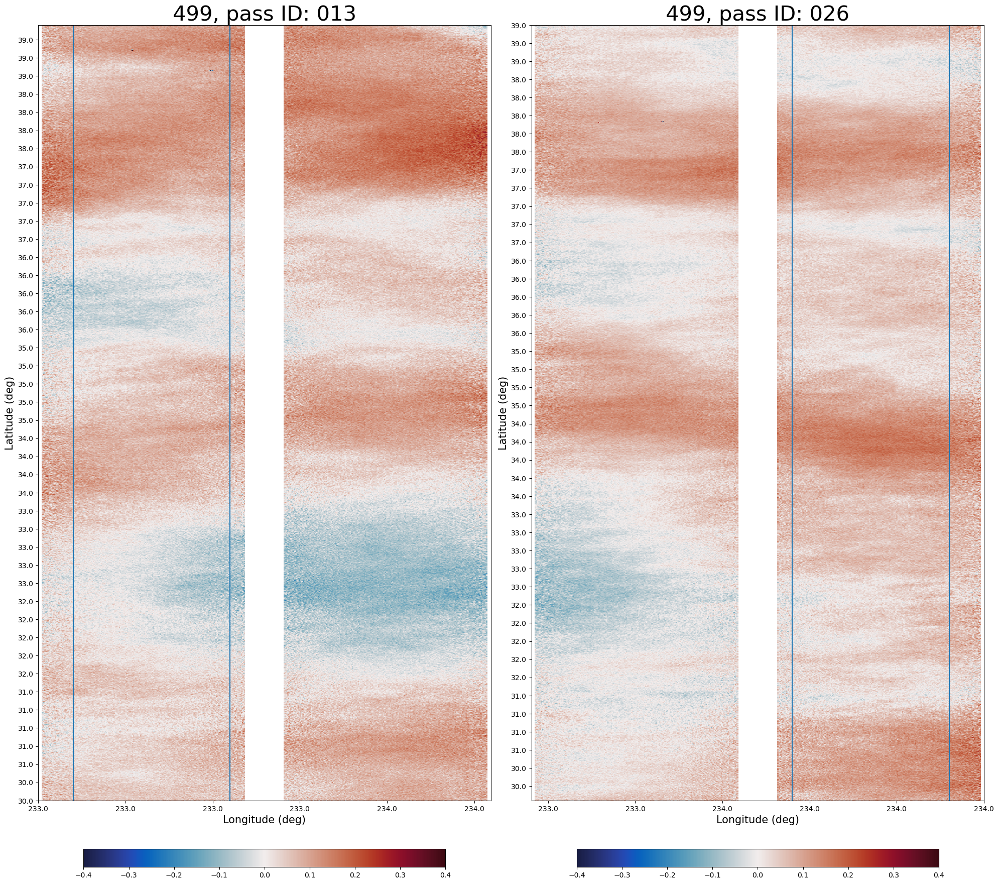

In [9]:
kwargs_signal = {"vmin":-0.4,"vmax":0.4,"cmap":cm.cm.balance}
cbar_kwargs = {"shrink":0.8,"orientation":"horizontal","pad":0.05}
field ="ssha_unedited"

fig, axs = plt.subplots(1,2,figsize=(20,20))

pass_ids = ["013","026"]

# make your plots
for i, ax in enumerate(axs):
    swath = swaths_to_plot_subset[i]
    plt.sca(ax)
    cax = ax.pcolor(swath[field], **kwargs_signal)
    plt.colorbar(cax, ax=ax, **cbar_kwargs)
    
    ax.set_yticks(swath.num_lines[::100],np.around(swath.latitude[::100,0].values,0))
    ax.set_xticks(swath.num_pixels[::100],np.around(swath.longitude[0,::100].values,0))
    plt.xticks(fontsize=10)
    plt.yticks(fontsize=10)
    ax.set_ylabel("Latitude (deg)",fontsize=15)
    ax.set_xlabel("Longitude (deg)",fontsize=15)

    ax.set_title(f"{cycle}, pass ID: {pass_ids[i]}",fontsize=30)

    # flip if your swath is descending
    if swath.latitude[0,0].values > swath.latitude[-1,0].values:
        ax.invert_yaxis()
    if swath.longitude[0,0].values > swath.longitude[0,-1].values:
        ax.invert_xaxis()

axs[0].vlines([40,220],0,len(swath[field]))
axs[1].vlines([40,220],0,len(swath[field]))
    
fig.tight_layout()

plt.show()
plt.close()



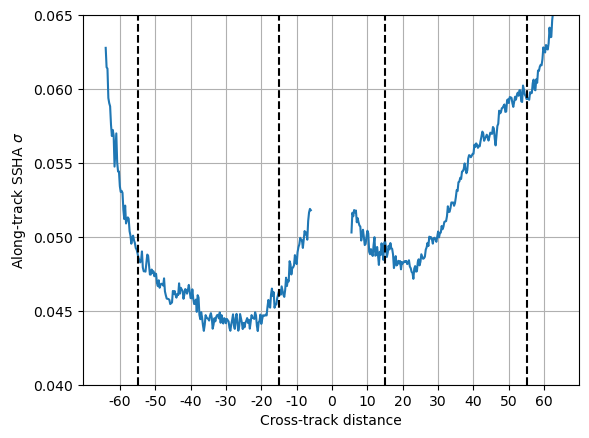

In [10]:
lim0 = 40
lim1 = 200


plt.plot(swath[field][0,:].num_pixels,np.std(swath[field],axis=0))
plt.xlabel("Cross-track distance")
plt.ylabel("Along-track SSHA $\sigma$")
plt.xticks(np.arange(5,131,10)*4,np.arange(5,131,10)-65)

plt.vlines([lim0,lim1,520-lim0,520-lim1],.04,.07,linestyle="--",color="k")
#plt.vlines([],.04,.07)
plt.ylim(0.04,0.065)
plt.grid()

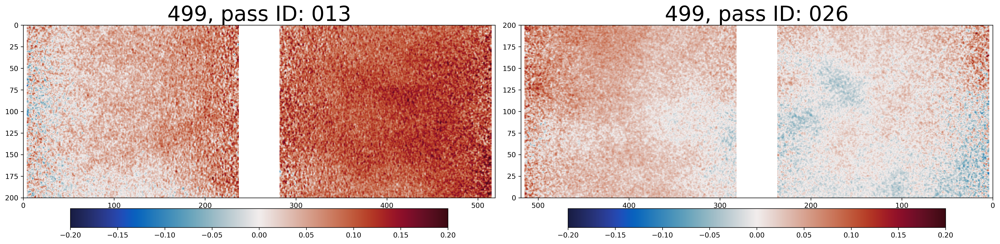

In [11]:
kwargs_signal = {"vmin":-0.2,"vmax":0.2,"cmap":cm.cm.balance}
cbar_kwargs = {"shrink":0.8,"orientation":"horizontal","pad":0.05}
field ="ssha_unedited"

fig, axs = plt.subplots(1,2,figsize=(20,5),dpi=300)

# make your plots
for i, ax in enumerate(axs):
    swath = swaths_to_plot_subset[i].isel(num_lines=slice(200,400),num_pixels=slice(0,519))
    plt.sca(ax)
    cax = ax.pcolor(swath[field], **kwargs_signal)
    plt.colorbar(cax, ax=ax, **cbar_kwargs)
    
    #ax.set_yticks(swath.num_lines[::100],np.around(swath.latitude[::100,0].values,0))
    #ax.set_xticks(swath.num_pixels[::100],np.around(swath.longitude[0,::100].values,0))
    #plt.xticks(fontsize=10)
    #plt.yticks(fontsize=10)
    #ax.set_ylabel("Latitude (deg)",fontsize=15)
    #ax.set_xlabel("Longitude (deg)",fontsize=15)

    ax.set_title(f"{cycle}, pass ID: {pass_ids[i]}",fontsize=30)

    # flip if your swath is descending
    if swath.latitude[0,0].values < swath.latitude[-1,0].values:
        ax.invert_yaxis()
    if swath.longitude[0,0].values > swath.longitude[0,-1].values:
        ax.invert_xaxis()

fig.tight_layout()

plt.show()
plt.close()


In [12]:
from scipy import signal 


In [13]:
import xrft



# Look at along-swath PSD using xrft

In [14]:
import numpy as np
import numpy.testing as npt
import xarray as xr
import xrft
import numpy.fft as npft
import dask.array as dsar
import matplotlib.pyplot as plt
%matplotlib inline

In [15]:
def compute_power_spectra_xrft(swath,subset=False,lim0=1,lim1=519,assert_parseval=False):
    """
    Inputs
    ------
    swath: 
    clean_swath_nan:
    lim0: 
    lim1:
    

    Outputs
    ------
    freqs: 
    psd_orig:
    
    """
    # Nan out columns you don't want
    if subset:
        swath[:,:lim0] = np.nan
        swath[:,lim1:520-lim1] = np.nan
        swath[:,520-lim0:] = np.nan
        
    # Mask out NaNed columns (sides/middle os swath) 
    msk = np.isnan(swath.mean(axis=0))
    swath = swath[:,~msk]

    # I'm assuming the dataset shape here...
    swath = swath.T

    # Create output arrays
    freqs = np.zeros(swath.shape)
    psd_orig = np.zeros(swath.shape)
    # Fourier transform
    FT_orig = np.zeros(swath.shape)

    # Perform along-swath FFT
    for i in range(len(swath)):
        swath_i = swath[i,:]
        Nx = swath_i.size
        dx = .25
        da = xr.DataArray(swath_i,dims="x",coords={"x": dx * np.arange(0,swath_i.size)},)

        # Calculate FFT
        FT = xrft.dft(da, dim="x", true_phase=True, true_amplitude=True)
        # Calculate power spectrum
        ps = xrft.power_spectrum(da, dim="x")

        # Record
        freqs[i,:] = FT["freq_x"].values
        psd_orig[i,:] = ps.values
        
        if assert_parseval:
            ###############
            # Assert Parseval's using xrft.dft
            ###############
            print("Parseval's theorem directly from FFT:")
            print((np.abs(da) ** 2).sum() * dx)
            print((np.abs(FT) ** 2).sum() * FT["freq_x"].spacing)
            print()
                                   
            ###############
            # Assert Parseval's using xrft.power_spectrum with scaling='density'
            ###############
            print("Parseval's theorem from power spectrum:")        
            print(ps.sum())
            print((np.abs(da) ** 2).sum() * dx )
            print()
        
    return freqs, psd_orig


In [16]:
# Specify the path to the subsetted data
path = f"../../SWOT_L3/Unsmoothed"

# Define domain
# Rough California
sw_corner = [-150.0, 30.0]
ne_corner = [-115.0, 39.0]
lat_lims = [sw_corner[1],ne_corner[1]]

# Define mission phase (1-day repeat vs science) and 
# cycles we are interested in
# Use sph_calval_swath for the 1-day repeats
path_to_sph_file="../orbit_data/sph_calval_swath.zip"
# Cycles 474 - 578 are from the 1-day repeat 
cycles = [str(c_num).zfill(3) for c_num in range(474,500)]



pass_IDs_list = tatsu_download.find_swaths(sw_corner, ne_corner,
                                           path_to_sph_file=path_to_sph_file)
# Fast repeat California
pass_IDs_list = ["013","026"]

cycle_data = {}

# MAKE SURE TO CHANGE THE SAVE PATH
for cycle in cycles:
    cycle_data[cycle] = tatsu_loader.load_cycle(path,fields=["time","ssha","ssha_unedited","ssha_noiseless","sigma0"],
                                                cycle=cycle,pass_ids=pass_IDs_list,subset=True,lats=lat_lims
                                               )


Loading SWOT_L3_LR_SSH_Unsmoothed_474_013_20230329T081622_20230329T090619_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_474_026_20230329T191927_20230329T201032_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_475_026_20230330T191004_20230330T200109_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_476_013_20230331T083831_20230331T084734_v1.0.2.nc
Whoops can't open dataset
An error occured: 'list' object has no attribute 'assign_attrs'
Loading SWOT_L3_LR_SSH_Unsmoothed_477_026_20230401T185119_20230401T194225_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_478_013_20230402T073744_20230402T082850_v1.0.2.nc
Whoops can't open dataset
An error occured: [Errno -101] NetCDF: HDF error: '/scratch/projects/shaferlab/tatsu/SWOT_L3/Unsmoothed/cycle_478/SWOT_L3_LR_SSH_Unsmoothed_478_013_20230402T073744_20230402T082850_v1.0.2.nc'
Loading SWOT_L3_LR_SSH_Unsmoothed_478_026_20230402T184157_20230402T193303_v1.0.2.nc
Loading SWOT_L3_LR_SSH_Unsmoothed_479_013_20230403T072822_20230403T081927_v1.0.2.nc
Loading SWOT_L3_LR_SS

In [20]:
reload(tatsu_swot)

cycle_frqs = {}
cycle_psds = {}

cycle_frqs_test = {}
cycle_psds_test = {}

cycle_frqs_test_ne = {}
cycle_psds_test_ne = {}

cycle_frqs_ne = {}
cycle_psds_ne = {}

#cycle_frqs_sm = {}
#cycle_psds_sm = {}

# Save unsmoothed swath spectrums
for cycle in cycles:
    print(cycle)
    tmp_swaths = cycle_data[cycle]
    tmp_freqs, tmp_amps = [], []
    tmp_freqs_ne, tmp_amps_ne = [], []
    #tmp_freqs_sm, tmp_amps_sm = [], []
    for swath in tmp_swaths:
        # Pull unedited ssh and convert to cm
        swath_unsmoothed = swath.ssha_unedited.values[:,:]*100
        #swath_smoothed = swath.ssha_noiseless.values[:,:]*100
        # Mask out NaN columns
        #msk = np.isnan(swath_unsmoothed.mean(axis=0))
        #swath_unsmoothed = swath_unsmoothed[:,~msk]
        # Get the PSD in the along-swath direction
        freqs_ne, psd_ne = compute_power_spectra_xrft(swath_unsmoothed,subset=True,lim0=40,lim1=200)
        #freqs_sm, psd_sm = compute_power_spectra_xrft(swath_smoothed,subset=True,lim0=40,lim1=200)
    
        tmp_freqs_ne.append(freqs_ne)
        tmp_amps_ne.append(psd_ne)
        #tmp_freqs_sm.append(freqs_sm)
        #tmp_amps_sm.append(psd_sm)
    
    cycle_frqs_ne[cycle] = tmp_freqs_ne
    cycle_psds_ne[cycle] = tmp_amps_ne
    #cycle_frqs_sm[cycle] = tmp_freqs_sm
    #cycle_psds_sm[cycle] = tmp_amps_sm

    test_spectra = tatsu_swot.compute_power_spectra_xrft(cycle_data[cycle])
    test_spectra_ne = tatsu_swot.compute_power_spectra_xrft(cycle_data[cycle],subset=True,lim0=40,lim1=200)
    #test_spectra_smoothed = tatsu_swot.compute_power_spectra_xrft(cycle_data[cycle],subset=True,lim0=40,lim1=200)
    
    cycle_frqs_test[cycle] = test_spectra[0]
    cycle_psds_test[cycle] = test_spectra[1]
    #cycle_frqs_test_smoothed[cycle] = test_spectra_smoothed[0]
    #cycle_psds_test_smoothed[cycle] = test_spectra_smoothed[1]
    cycle_frqs_test_ne[cycle] = test_spectra_ne[0]
    cycle_psds_test_ne[cycle] = test_spectra_ne[1]
    


474
475
476
477
478
479
480
481
482
483
484
485
486
487
488
489
490
491
492
493
494
495
496
497
498
499


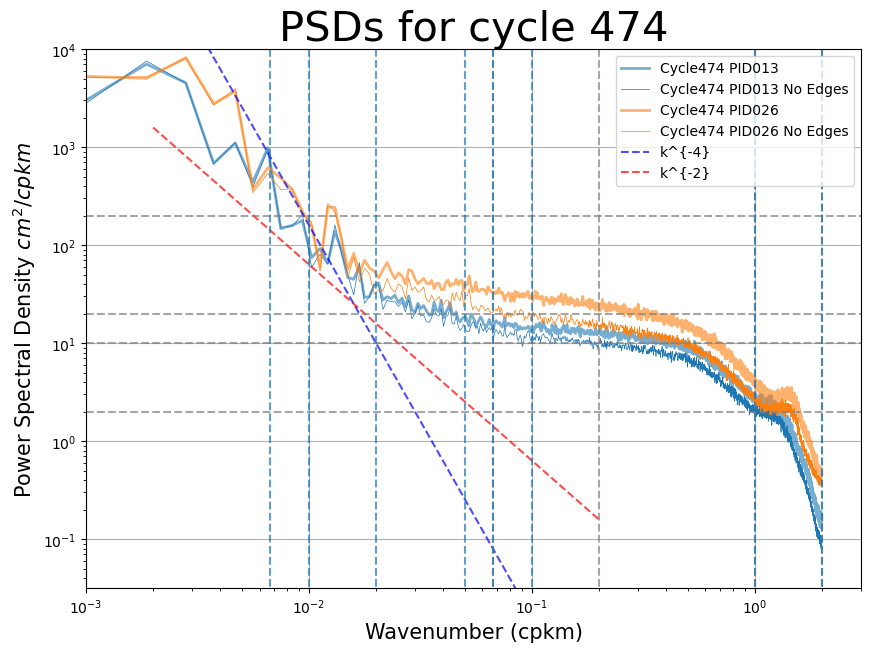

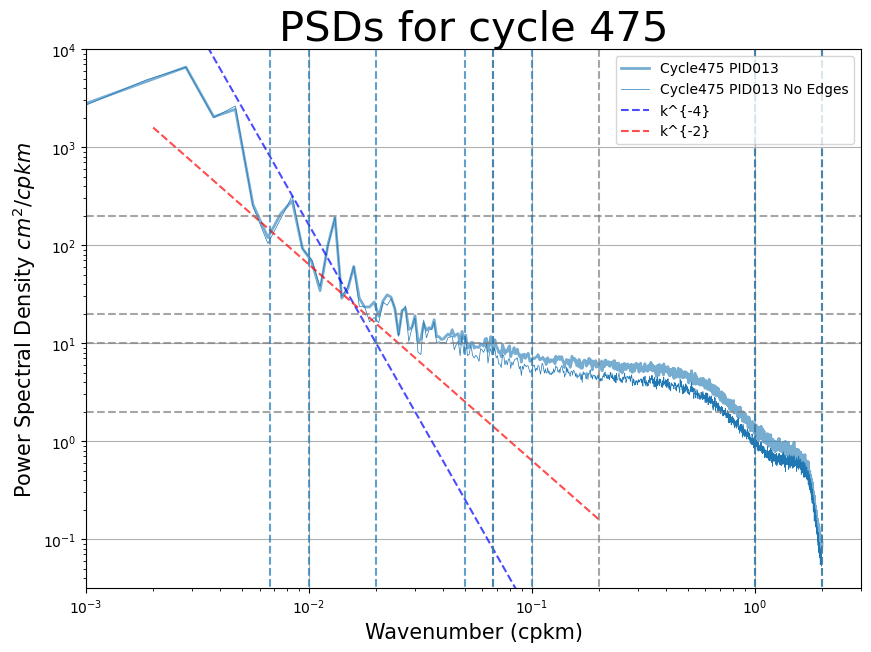

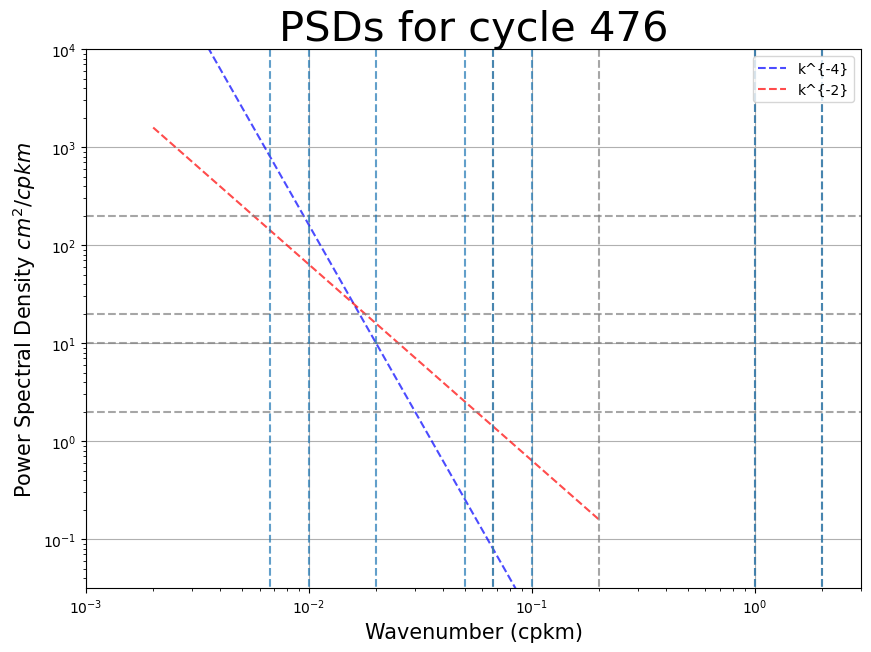

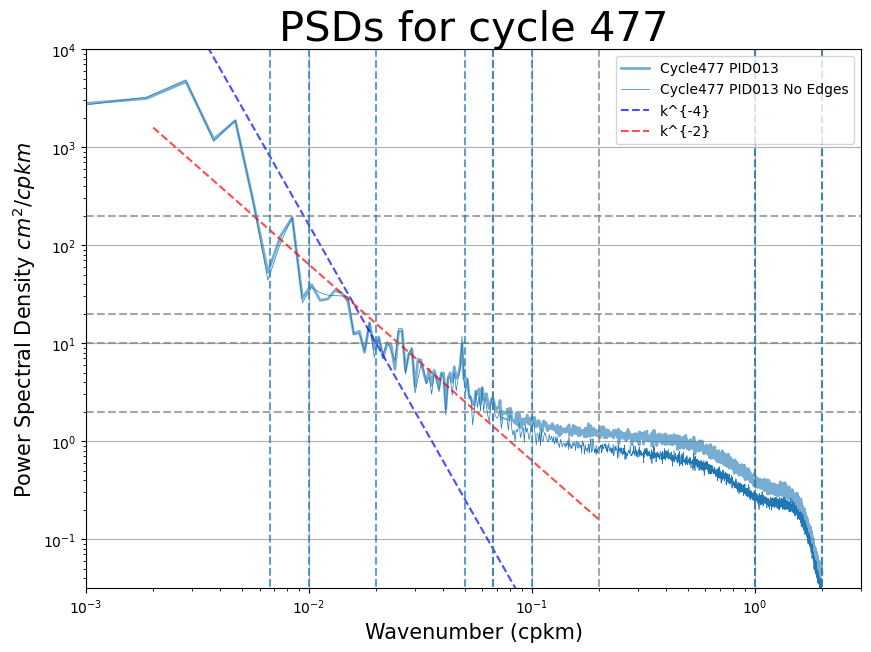

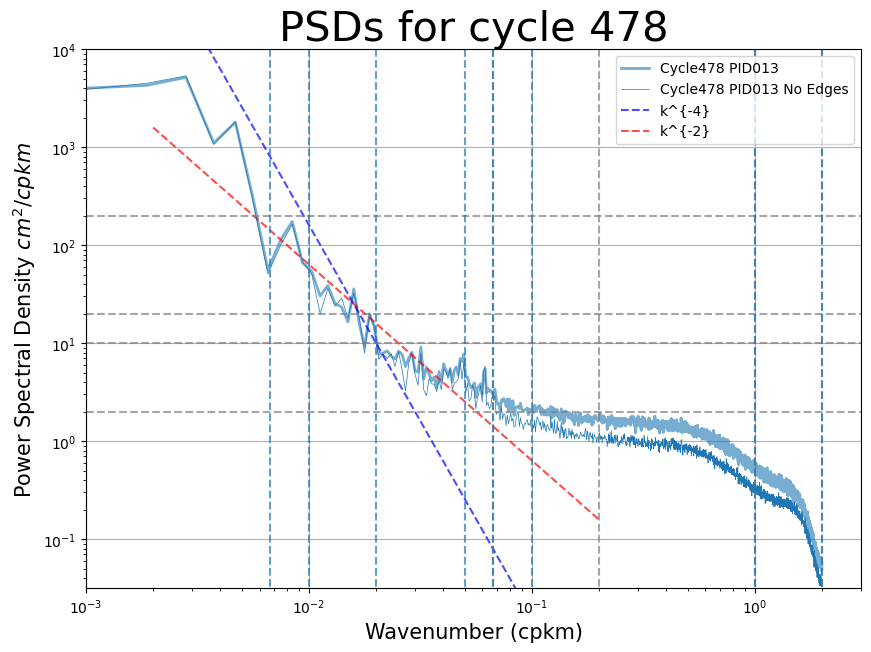

...

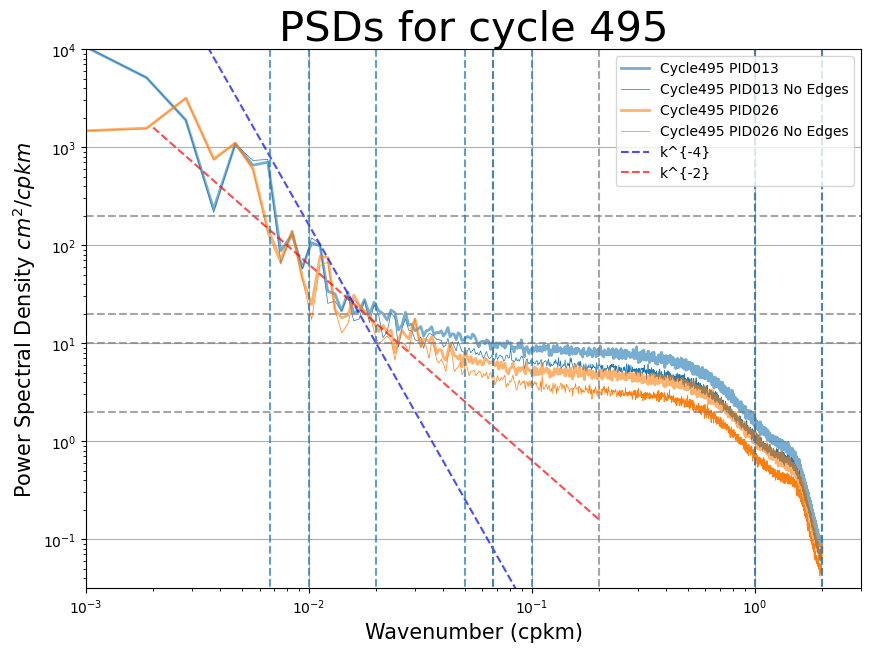

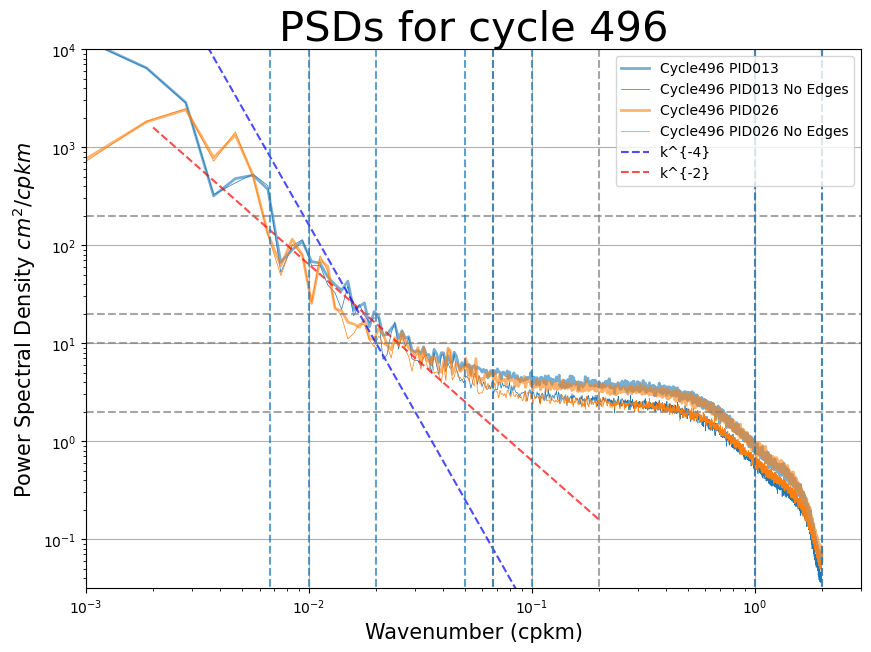

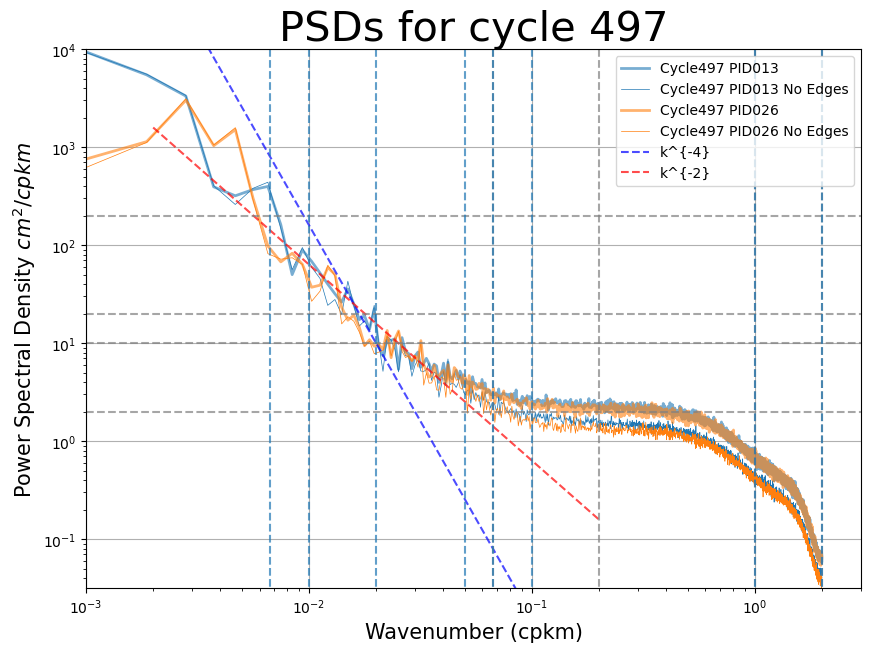

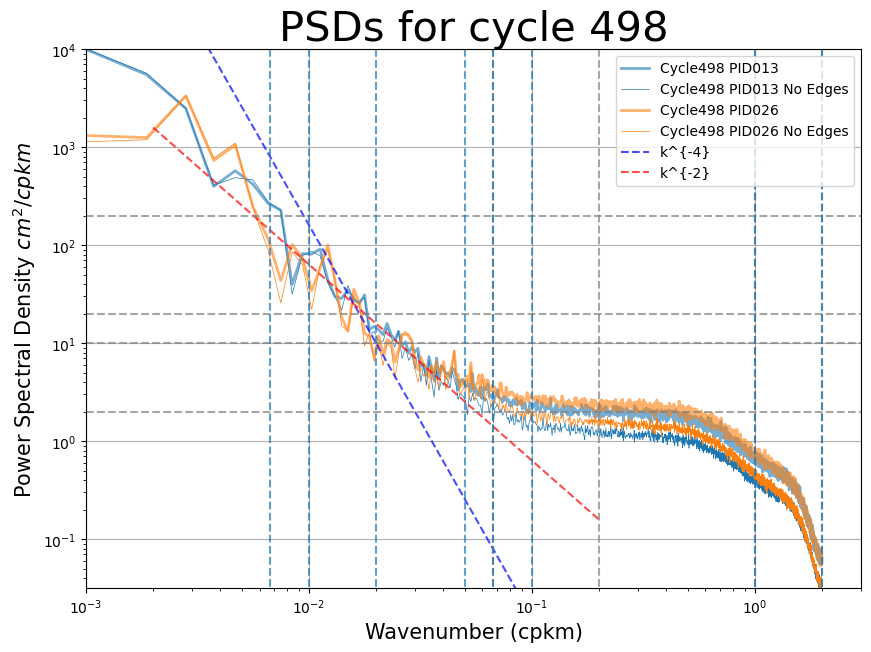

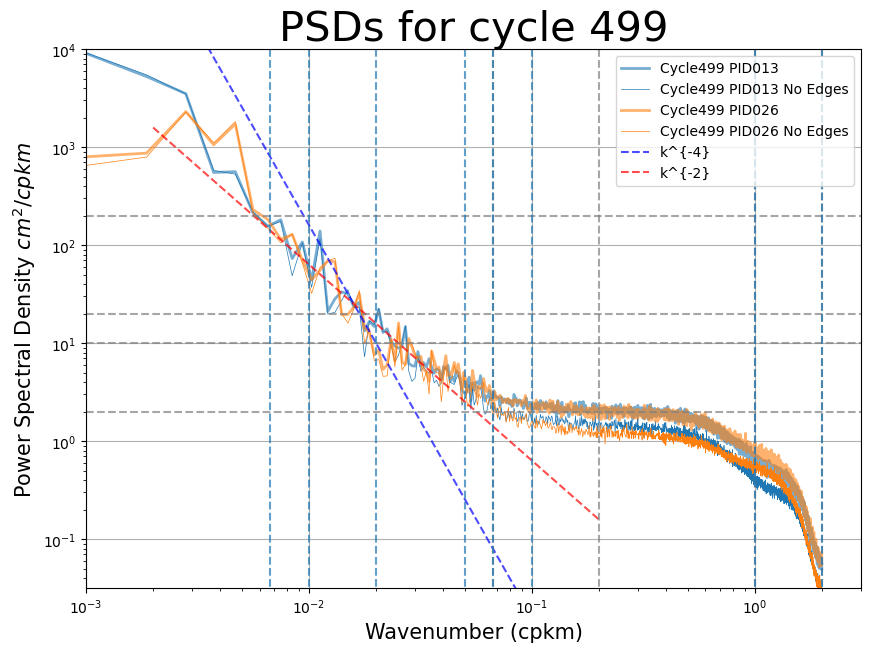

In [21]:
for cycle in cycles:
    
    fig, axs = plt.subplots(1,1,figsize=(10,7))
    
    for i, f in enumerate(cycle_frqs_test[cycle]):
        line, = axs.loglog(cycle_frqs_test[cycle][i].mean(axis=0),
                           cycle_psds_test[cycle][i].mean(axis=0),
                           label=f"Cycle{cycle} PID{pass_ids[i]}",alpha=0.6,linewidth=2)
        
        axs.loglog(cycle_frqs_test_ne[cycle][i].mean(axis=0),
                   cycle_psds_test_ne[cycle][i].mean(axis=0),
                   label=f"Cycle{cycle} PID{pass_ids[i]} No Edges",
                   alpha=1,color=line.get_color(),linewidth=0.5)

    x = np.linspace(0.01, 1, 100)
    axs.loglog(x*.15, (x**-4)/10**2.5, color='blue',label="k^{-4}",linestyle="dashed",alpha=0.7)
    axs.loglog(x*.2, (x**-2)/10**.8, color='red',label="k^{-2}",linestyle="dashed",alpha=0.7)
    
    axs.hlines([2, 10,20,200],10**-3,10,color="grey",linestyle="--",alpha=0.7)
    axs.vlines([1/15,1/5,1, 2],0,10**5,color="grey",linestyle="--",alpha=0.7)
    
    axs.set_title(f"PSDs for cycle {cycle}",fontsize=30)
    axs.set_xlabel('Wavenumber (cpkm)',fontsize=15)
    axs.set_ylabel('Power Spectral Density $cm^{2}/cpkm$',fontsize=15)

    axs.vlines([1/150,1/100,1/50,1/20,1/15,1/10,1/1,1/.5],0,10**5,linestyle="--",alpha=0.7)
    axs.legend()
    axs.set_ylim(10**-1.5,10**4)
    axs.set_xlim(10**-3,3)
    axs.grid()
    
    plt.show()
    plt.close()

KeyError: '474'

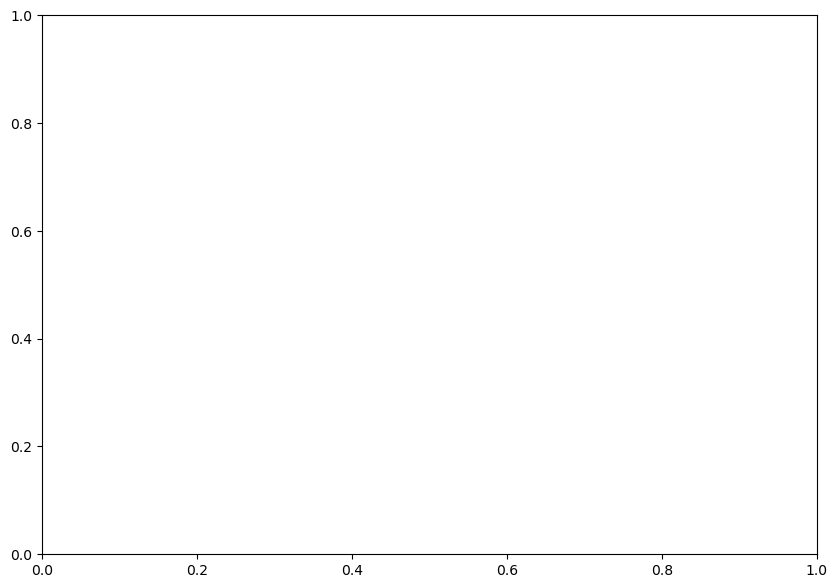

In [22]:
for cycle in cycles:
    
    fig, axs = plt.subplots(1,1,figsize=(10,7))
    
    for i, f in enumerate(cycle_frqs[cycle]):
        line, = axs.loglog(cycle_frqs_test[cycle][i].mean(axis=0),
                           cycle_psds_test[cycle][i].mean(axis=0),
                           label=f"Cycle{cycle} PID{pass_ids[i]}",alpha=0.6,linewidth=2)
        
        axs.loglog(cycle_frqs_ne[cycle][i].mean(axis=0),
                   cycle_psds_ne[cycle][i].mean(axis=0),
                   label=f"Cycle{cycle} PID{pass_ids[i]} No Edges",
                   alpha=1,color=line.get_color(),linewidth=0.5)

    x = np.linspace(0.01, 1, 100)
    axs.loglog(x*.15, (x**-4)/10**2.5, color='blue',label="k^{-4}",linestyle="dashed",alpha=0.7)
    axs.loglog(x*.2, (x**-2)/10**.8, color='red',label="k^{-2}",linestyle="dashed",alpha=0.7)
    
    axs.hlines([2, 10,20,200],10**-3,10,color="grey",linestyle="--",alpha=0.7)
    axs.vlines([1/15,1/5,1, 2],0,10**5,color="grey",linestyle="--",alpha=0.7)
    
    axs.set_title(f"PSDs for cycle {cycle}",fontsize=30)
    axs.set_xlabel('Wavenumber (cpkm)',fontsize=15)
    axs.set_ylabel('Power Spectral Density $cm^{2}/cpkm$',fontsize=15)

    axs.vlines([1/150,1/100,1/50,1/20,1/15,1/10,1/1,1/.5],0,10**5,linestyle="--",alpha=0.7)
    axs.legend()
    axs.set_ylim(10**-1.5,10**4)
    axs.set_xlim(10**-3,3)
    axs.grid()
    
    plt.show()
    plt.close()